In [112]:
import pandas as pd
import matplotlib.pyplot as plt

# ---- 1. Load CSV ----
file_path = "Trees.csv"  # change to your file
df = pd.read_csv(file_path)

# # ---- 2. Basic dataset overview ----
print("\nDataset shape:")
print(df.shape)

print("\nColumn names:")
print(df.columns)

# print("\nFirst few rows:")
# print(df.head())

# print("\nData types:")
# print(df.dtypes)


Dataset shape:
(55676, 61)

Column names:
Index(['OBJECTID', 'ASSET_ID', 'SITE_NAME', 'PLOT_NO', 'FEATURE_ID',
       'LOCATION', 'TYPE', 'PRIM_MEAS', 'UNIT', 'SITE_CODE', 'FEAT_GP', 'X',
       'Y', 'DEAD', 'CLASSIFICATION', 'EXTENT_EASTING_1', 'EXTENT_NORTHING_1',
       'EXTENT_EASTING_2', 'EXTENT_NORTHING_2', 'LAYERS', 'LATIN_CODE',
       'LATIN_NAME', 'FEATURE_TYPE_NAME', 'COMMON_NAME', 'FULL_COMMON_NAME',
       'CROWN_HEIGHT', 'CROWN_WIDTH', 'CROWN_AREA', 'DBH',
       'LOCATION_RISK_ZONE', 'EPICORMIC', 'INSURANCE_CLAIM_HISTORY',
       'CENTRAL_ASSET_ID', 'CONTRACT_AREA_NAME', 'CUSTOMER', 'DEAD_FLAG',
       'FEATURE_GROUP', 'FEATURE_GROUP_CODE', 'FEATURETYPECODE', 'NOTES',
       'REVISION_NO', 'TREE_SPECIES', 'TREE_MODIFIED_RISK',
       'CANOPY_SIZE_AT_MATURITY', 'SPONSORSHIP', 'SPONSORSHIP_PACKAGE',
       'PLANTING_SEASON', 'PLANTING_FUNDER', 'PLANTING_NOTES', 'SPECIES_NOTES',
       'TREE_TYPE', 'JOBS_REQUIRED', 'SERVICES_VISIBILITY', 'CONSTRAINTS',
       'CANCELLATION

In [113]:
cols = ["OBJECTID", "SITE_NAME", "X", "Y", "EXTENT_EASTING_1", "EXTENT_NORTHING_1", "EXTENT_EASTING_2", "EXTENT_NORTHING_2",
        "LATIN_NAME", "COMMON_NAME", "FULL_COMMON_NAME", "TREE_SPECIES",
        "CROWN_WIDTH", "CROWN_HEIGHT", "CROWN_AREA", "DBH", "PLANTING_SEASON"]
#print(df[cols])

numeric_cols = ["CROWN_WIDTH", "CROWN_HEIGHT", "DBH"]

df = df[cols]
#print(df)

for col in numeric_cols:
    df[col] = (
        df[col]
        .str.extract(r'(\d+\.?\d*)')[0]   # pull out the number
        .astype(float)
    )
#print(df[cols])

df["DBH"] = df["DBH"] * 0.01

# for CROWN_AREA col 
# extract ranges 
ranges = df["CROWN_AREA"].str.extract(r"(\d+\.?\d*)\s*-\s*(\d+\.?\d*)").astype(float)
upto = df["CROWN_AREA"].str.extract(r"Up to (\d+\.?\d*)").astype(float)

min_val = ranges[0]
max_val = ranges[1]

mask = upto[0].notna()
min_val.loc[mask] = 0
max_val.loc[mask] = upto[0]

# insert next to original column
col_idx = df.columns.get_loc("CROWN_AREA")
df.insert(col_idx + 1, "MIN_CROWN_AREA", min_val)
df.insert(col_idx + 2, "MAX_CROWN_AREA", max_val)

# drop old column for area
df = df.drop(columns=["CROWN_AREA"])

# create midpoint
df["CROWN_AREA_MIDPOINT"] = (df["MIN_CROWN_AREA"] + df["MAX_CROWN_AREA"]) / 2

# drop old columns
df = df.drop(columns=["MIN_CROWN_AREA", "MAX_CROWN_AREA"])

In [114]:
print(df)

       OBJECTID                                SITE_NAME          X  \
0      26609351  Dovercourt Road To Muller Road Footpath  359956.40   
1      26609352  Dovercourt Road To Muller Road Footpath  359933.76   
2      26609353      Eastville Roundabout M32 Junction 2  361186.30   
3      26609354      Eastville Roundabout M32 Junction 2  361181.52   
4      26609355      Eastville Roundabout M32 Junction 2  361164.98   
...         ...                                      ...        ...   
55671  26665022                           Harptree Grove  357866.78   
55672  26665023                           Harptree Grove  357867.89   
55673  26665024                           Harptree Grove  357870.10   
55674  26665025                           Harptree Grove  357873.44   
55675  26665026                           Harptree Grove  357877.62   

               Y  EXTENT_EASTING_1  EXTENT_NORTHING_1  EXTENT_EASTING_2  \
0      176260.01         359956.40          176260.01         359956.40 

In [115]:
# filter out ZZ dead / anomalous trees
df["LATIN_NAME"].str.startswith("ZZ", na=False).sum()
df = df[~df["LATIN_NAME"].str.startswith("ZZ", na=False)]

df

,OBJECTID,SITE_NAME,X,Y,EXTENT_EASTING_1,EXTENT_NORTHING_1,EXTENT_EASTING_2,EXTENT_NORTHING_2,LATIN_NAME,COMMON_NAME,FULL_COMMON_NAME,TREE_SPECIES,CROWN_WIDTH,CROWN_HEIGHT,DBH,PLANTING_SEASON,CROWN_AREA_MIDPOINT
0,26609351,Dovercourt Road To Muller Road Footpath,359956.40,176260.01,359956.40,176260.01,359956.40,176260.01,Fraxinus excelsior,Ash,Common ash,Fraxinus excelsior,14.0,15.0,NaN,Not Applicable,NaN
1,26609352,Dovercourt Road To Muller Road Footpath,359933.76,176296.56,359933.76,176296.56,359933.76,176296.56,Prunus - Species Unknown,Cherry,Unidentified cherry,Prunus - Species Unknown,NaN,NaN,NaN,Not Applicable,NaN
2,26609353,Eastville Roundabout M32 Junction 2,361186.30,175261.56,361186.30,175261.56,361186.30,175261.56,Metasequoia glyptostroboides,Dawn Redwood,Dawn redwood,Metasequoia glyptostroboides,1.0,4.0,0.07,Planting Season 08/09,10.00
3,26609354,Eastville Roundabout M32 Junction 2,361181.52,175236.67,361181.52,175236.67,361181.52,175236.67,Metasequoia glyptostroboides,Dawn Redwood,Dawn redwood,Metasequoia glyptostroboides,1.0,4.0,0.06,Planting Season 08/09,10.00
4,26609355,Eastville Roundabout M32 Junction 2,361164.98,175223.73,361164.98,175223.73,361164.98,175223.73,Metasequoia glyptostroboides,Dawn Redwood,Dawn redwood,Metasequoia glyptostroboides,NaN,NaN,NaN,Not Applicable,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55671,26665022,Harptree Grove,357866.78,170853.97,357866.78,170853.97,357866.78,170853.97,Acer pseudoplatanus,Sycamore,Sycamore,Acer pseudoplatanus,6.0,8.0,0.32,Not Applicable,60.05
55672,26665023,Harptree Grove,357867.89,170860.00,357867.89,170860.00,357867.89,170860.00,Acer pseudoplatanus,Sycamore,Sycamore,Acer pseudoplatanus,7.0,8.0,0.32,Not Applicable,60.05
55673,26665024,Harptree Grove,357870.10,170864.07,357870.10,170864.07,357870.10,170864.07,Acer pseudoplatanus,Sycamore,Sycamore,Acer pseudoplatanus,7.0,8.0,0.35,Not Applicable,60.05
55674,26665025,Harptree Grove,357873.44,170868.63,357873.44,170868.63,357873.44,170868.63,Acer pseudoplatanus,Sycamore,Sycamore,Acer pseudoplatanus,7.0,9.0,0.34,Not Applicable,60.05


In [116]:
# df.to_csv("final_tree_dataset_potential.csv", index=False)

In [117]:
species_counts = df["LATIN_NAME"].value_counts()
species_counts.to_csv("latin_counts.csv", index=True)

print(species_counts)
# count = non-NaN
# size = total rows → so NaN = size - count

# print(summary)

LATIN_NAME
Acer pseudoplatanus             3024
Fraxinus excelsior              2967
Tilia x europea                 2880
Platanus x acerifolia           2862
Acer platanoides                2440
                                ... 
Tilia tomentosa 'Brabant'          1
Alnus incana Aurea                 1
Crataegus oxyacanthoides           1
Juniperus communis Hibernica       1
Thuja orientalis                   1
Name: count, Length: 524, dtype: int64


In [120]:
df[df["CROWN_HEIGHT"].isna()]

# numeric_cols = ["CROWN_WIDTH", "CROWN_HEIGHT", "DBH", "MIN_CROWN_AREA", "MAX_CROWN_AREA"]

# all_nan = df[numeric_cols].isna().all(axis=1)

# df_all_nan = df[all_nan]
# print(df_all_nan)

,OBJECTID,SITE_NAME,X,Y,EXTENT_EASTING_1,EXTENT_NORTHING_1,EXTENT_EASTING_2,EXTENT_NORTHING_2,LATIN_NAME,COMMON_NAME,FULL_COMMON_NAME,TREE_SPECIES,CROWN_WIDTH,CROWN_HEIGHT,DBH,PLANTING_SEASON,CROWN_AREA_MIDPOINT
1,26609352,Dovercourt Road To Muller Road Footpath,359933.76,176296.56,359933.76,176296.56,359933.76,176296.56,Prunus - Species Unknown,Cherry,Unidentified cherry,Prunus - Species Unknown,NaN,NaN,NaN,Not Applicable,NaN
4,26609355,Eastville Roundabout M32 Junction 2,361164.98,175223.73,361164.98,175223.73,361164.98,175223.73,Metasequoia glyptostroboides,Dawn Redwood,Dawn redwood,Metasequoia glyptostroboides,NaN,NaN,NaN,Not Applicable,NaN
12,26609363,Homemead Drive To Subway,361599.84,170383.61,361599.84,170383.61,361599.84,170383.61,Mixed Species Group,NaN,NaN,Mixed Species Group,NaN,NaN,NaN,Not Applicable,NaN
48,26609399,Mercia Drive To Penfield Road Footpaths,360085.18,174793.45,360085.18,174793.45,360085.18,174793.45,Prunus Tai-haku,Cherry,Japanese flowering cherry,Prunus Tai-haku,NaN,NaN,0.40,Not Applicable,NaN
57,26609408,Maybourne And Sidcot Footpaths,363171.28,170676.60,0.00,0.00,0.00,0.00,Acer cappadocicum,Tulip Tree,Cappadocian maple,Acer cappadocicum,NaN,NaN,0.06,Planting Season 22/23,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55639,26664990,Hareclive Road,357906.76,167930.43,357906.76,167930.43,357906.76,167930.43,Acer platanoides,Maple,Norway maple,Acer platanoides,NaN,NaN,NaN,Planting Season 11/12,NaN
55645,26664996,Hareclive Road,357975.87,167878.66,357975.87,167878.66,357975.87,167878.66,Acer pseudoplatanus Brillianti,Sycamore,Sycamore 'Brillianti',Acer pseudoplatanus Brillianti,NaN,NaN,0.06,Planting Season 23/24,NaN
55660,26665011,Hareclive Road Flats 1-23,357620.51,168377.86,357620.51,168377.86,357620.51,168377.86,Acer campestre 'Will Cladwell',Field Maple,Field maple,Acer campestre 'Will Cladwell',NaN,NaN,NaN,Planting Season 11/12,NaN
55664,26665015,Hareclive Road Flats 1-23,357630.41,168354.62,357630.41,168354.62,357630.41,168354.62,Acer campestre,Field Maple,Field maple,Acer campestre,NaN,NaN,NaN,Planting Season 11/12,NaN


In [131]:
# masks
no_area = df["CROWN_AREA_MIDPOINT"].isna()
has_dbh = df["DBH"].notna()
no_dbh = df["DBH"].isna()

has_other = (
    df["CROWN_HEIGHT"].notna() |
    df["CROWN_WIDTH"].notna()
)

# ---- Level 1 ----
no_area_has_dbh = (no_area & has_dbh).sum()

no_area_no_dbh_mask = no_area & no_dbh
no_area_no_dbh = no_area_no_dbh_mask.sum()

print("No crown area BUT has DBH:", no_area_has_dbh)
print("No crown area AND no DBH:", no_area_no_dbh)

# ---- Level 2 (ONLY within the 3245 subset) ----
no_dbh_has_other = (no_area_no_dbh_mask & has_other).sum()
no_dbh_no_other = (no_area_no_dbh_mask & ~has_other).sum()

print("  ├─ No DBH BUT has other data:", no_dbh_has_other)
print("  └─ No DBH AND no other data:", no_dbh_no_other)

No crown area BUT has DBH: 10024
No crown area AND no DBH: 3245
  ├─ No DBH BUT has other data: 746
  └─ No DBH AND no other data: 2499


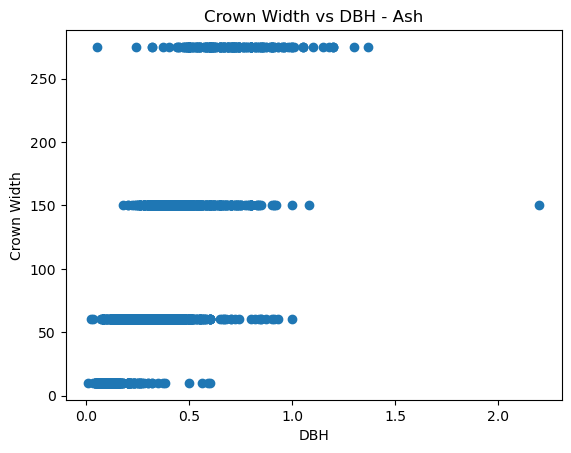

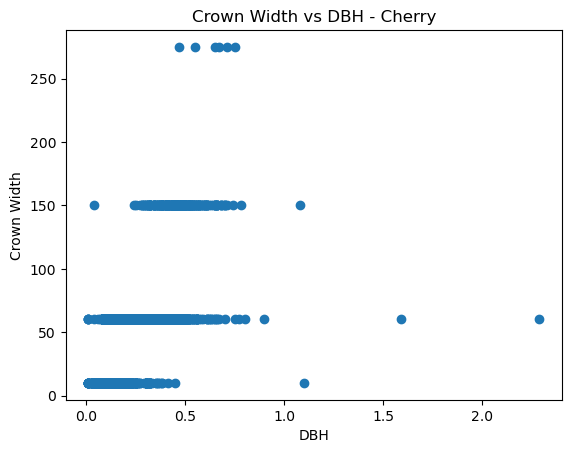

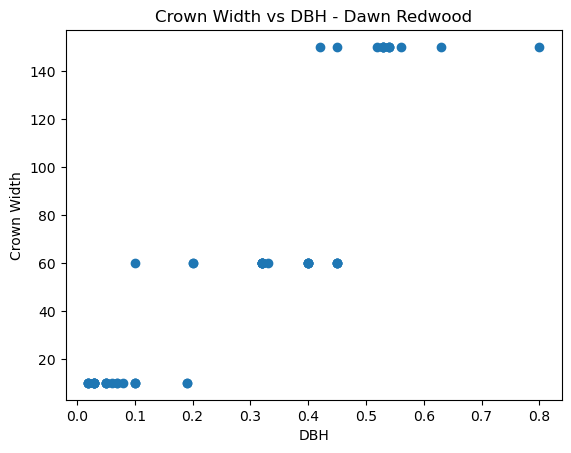

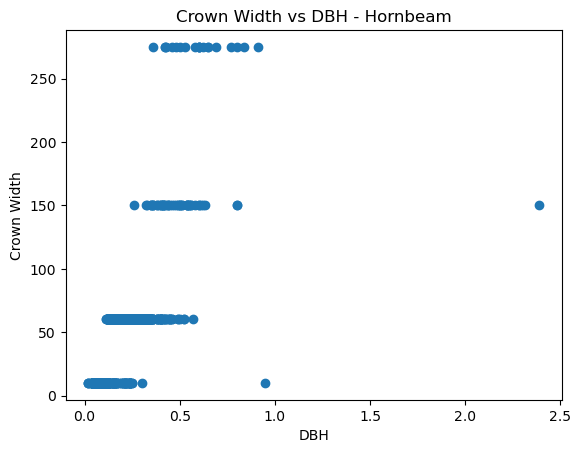

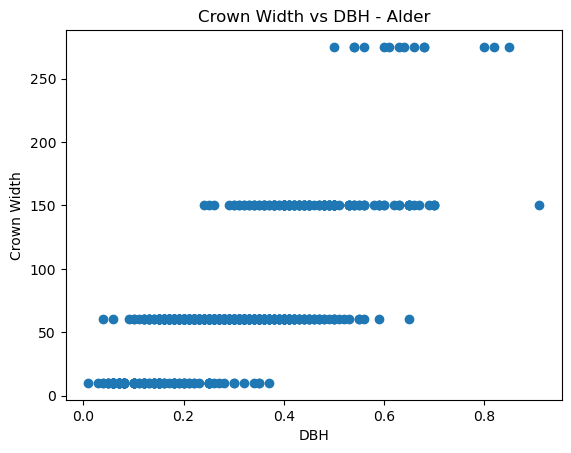

...

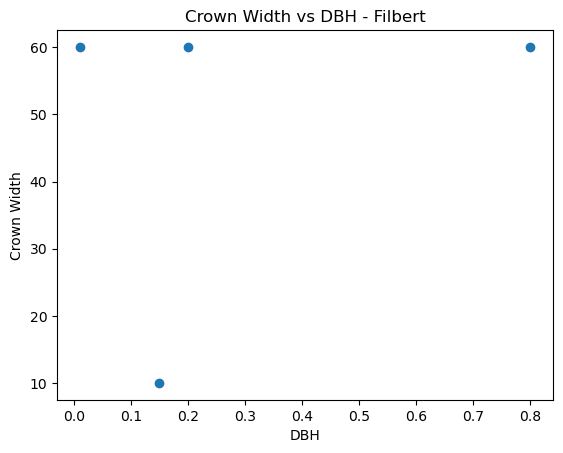

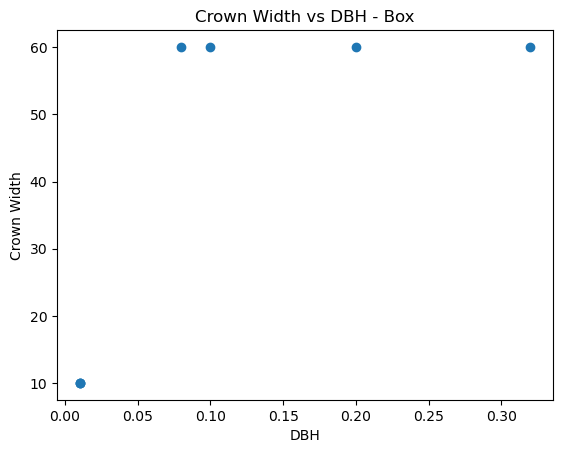

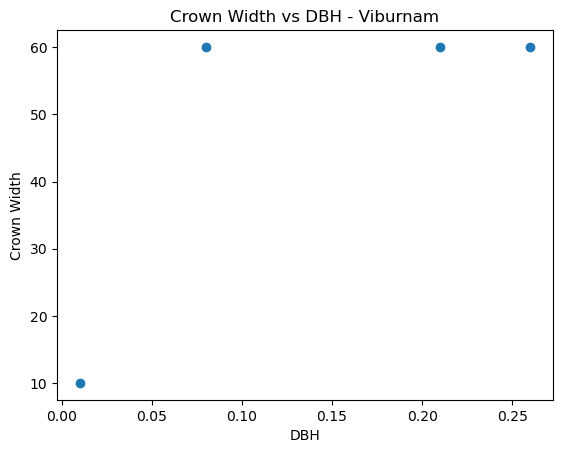

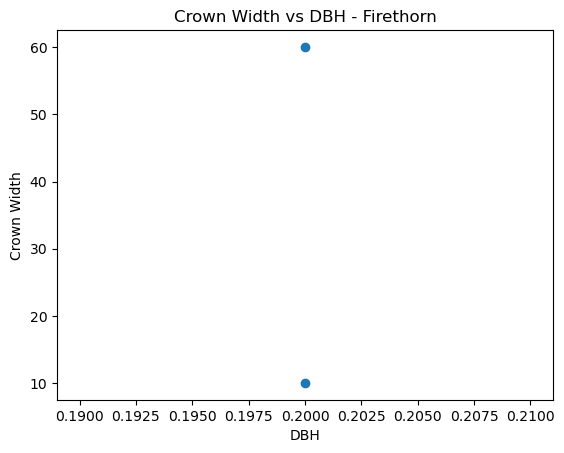

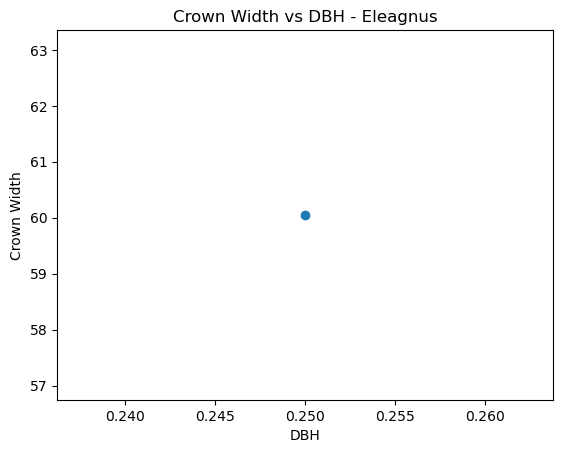

KeyError: 'SPECIES'

In [123]:
min_points = 1000

import matplotlib.pyplot as plt

species_list = df["COMMON_NAME"].dropna().unique()

for species in species_list:
    df_species = df[df["COMMON_NAME"] == species]
    
    # drop rows where either value is missing
    df_plot = df_species[["DBH", "CROWN_AREA_MIDPOINT"]].dropna()
    
    if df_plot.empty:
        continue
    
    plt.figure()
    plt.scatter(df_plot["DBH"], df_plot["CROWN_AREA_MIDPOINT"])
    
    plt.title(f"Crown Width vs DBH - {species}")
    plt.xlabel("DBH")
    plt.ylabel("Crown Width")
    
    plt.show()

for species in species_list:
    df_species = df[df["SPECIES"] == species]
    df_plot = df_species[["DBH", "CROWN_WIDTH"]].dropna()
    
    if len(df_plot) < min_points:
        continue
    
    plt.figure()
    plt.scatter(df_plot["DBH"], df_plot["CROWN_WIDTH"])
    
    plt.title(f"{species} (n={len(df_plot)})")
    plt.xlabel("DBH")
    plt.ylabel("Crown Width")
    
    plt.show()

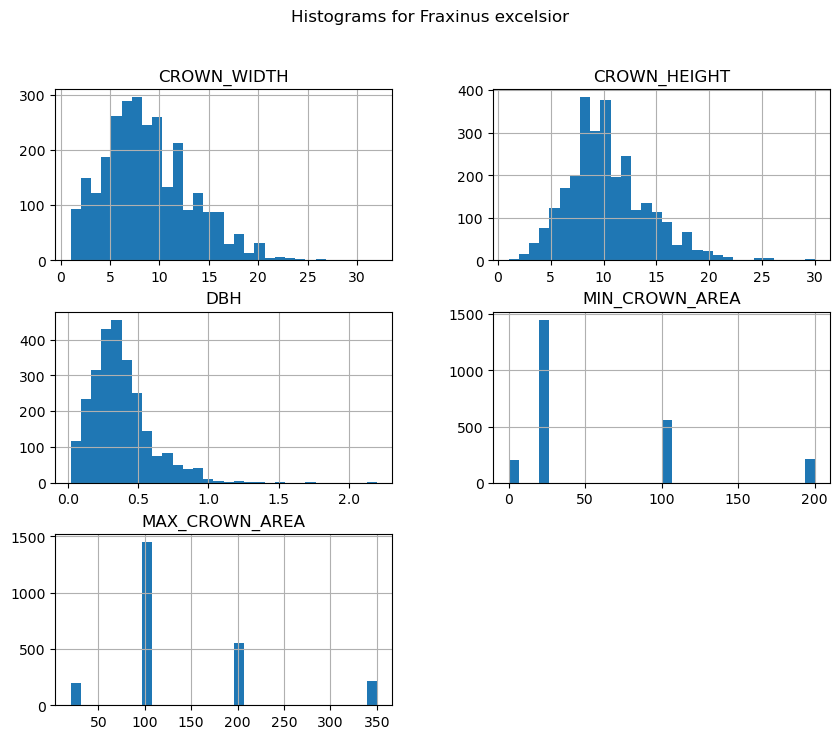

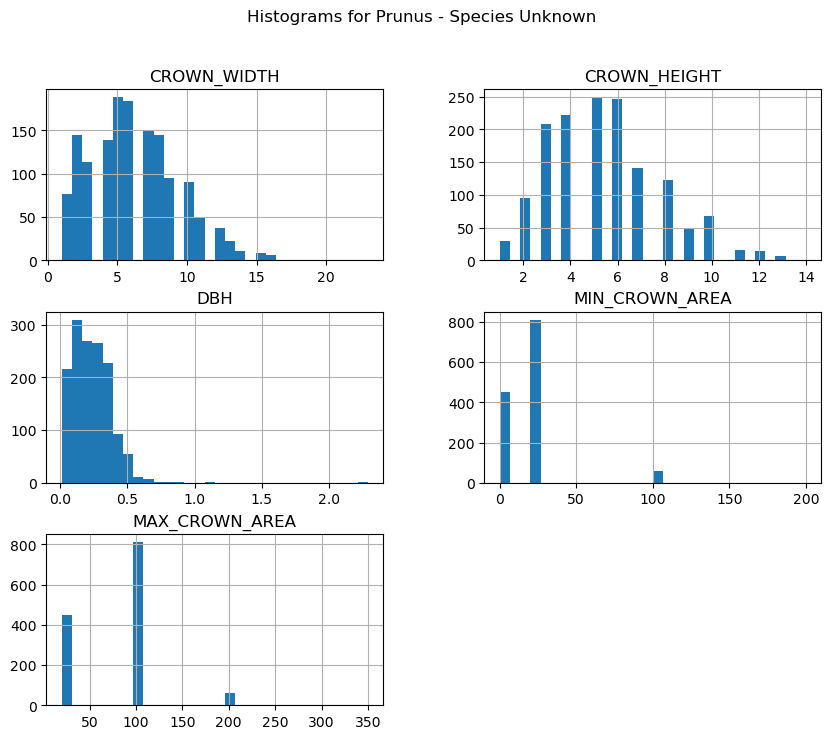

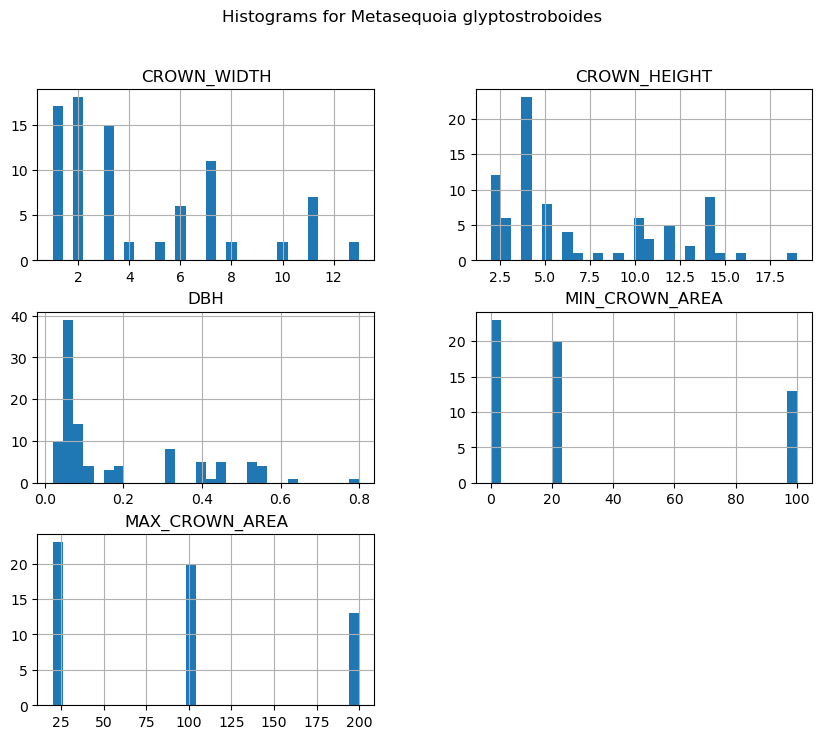

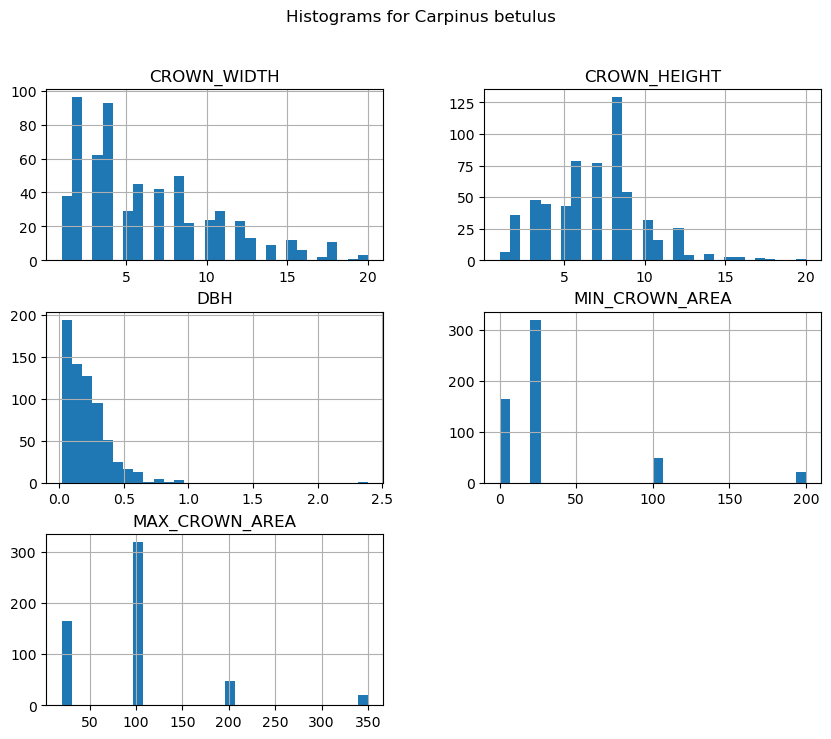

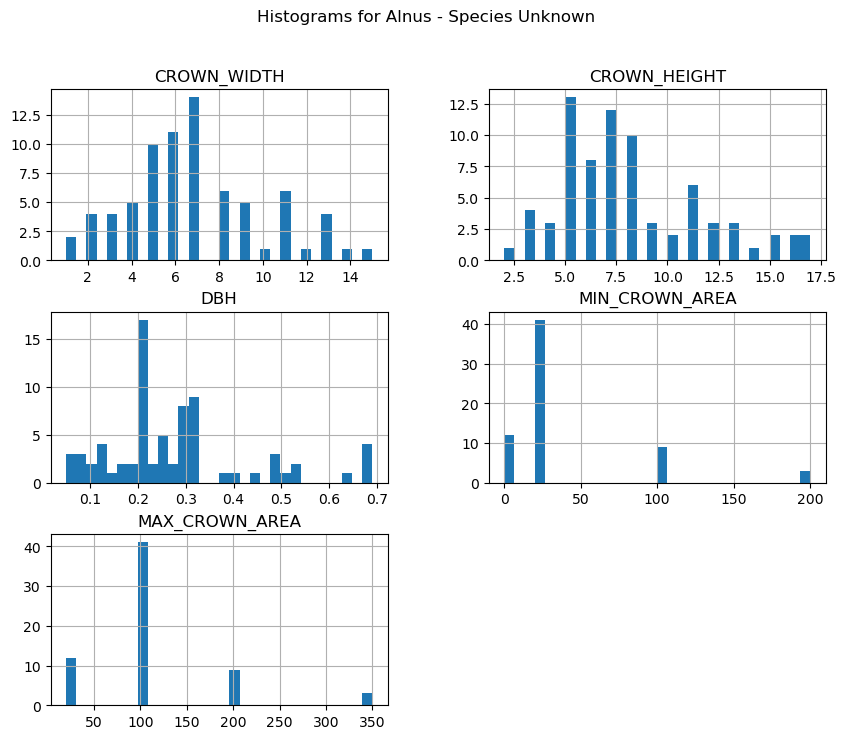

...

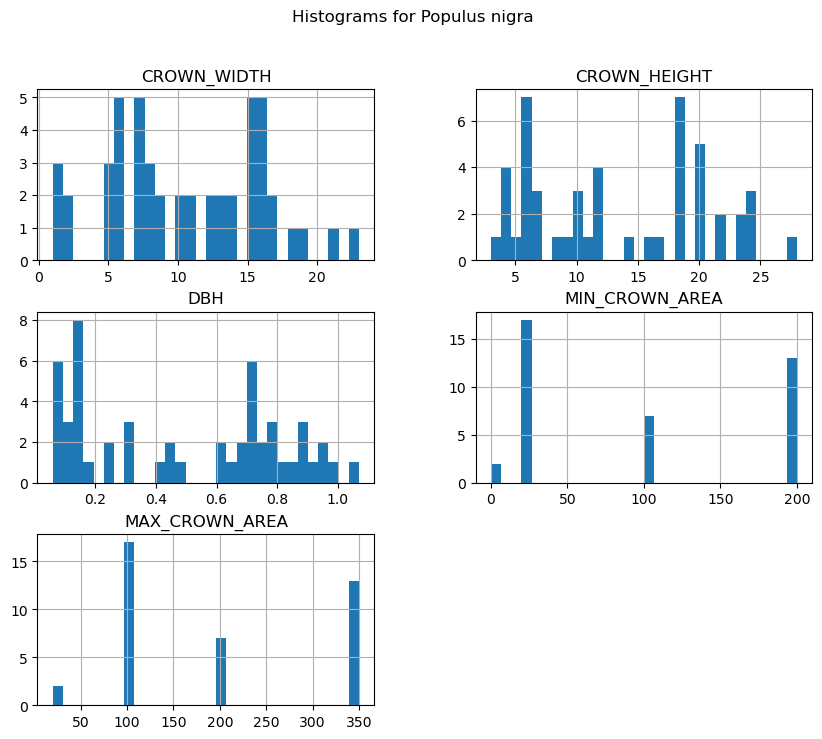

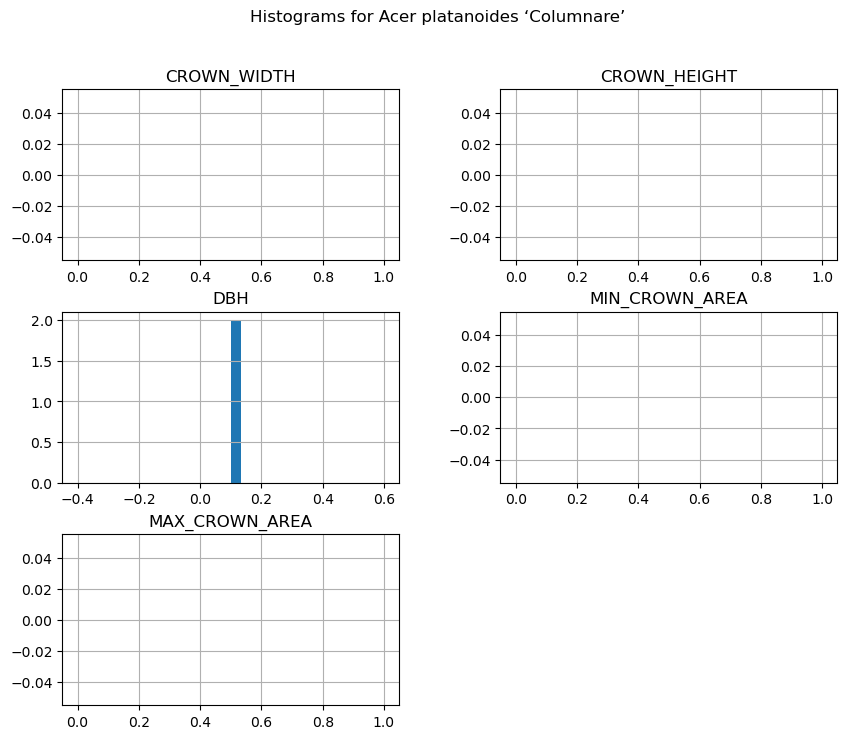

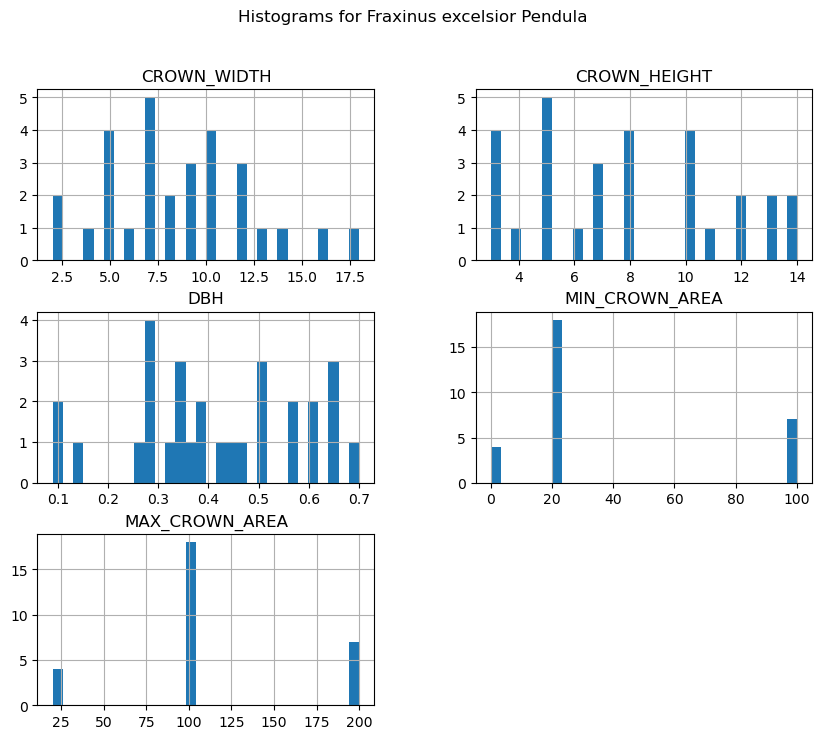

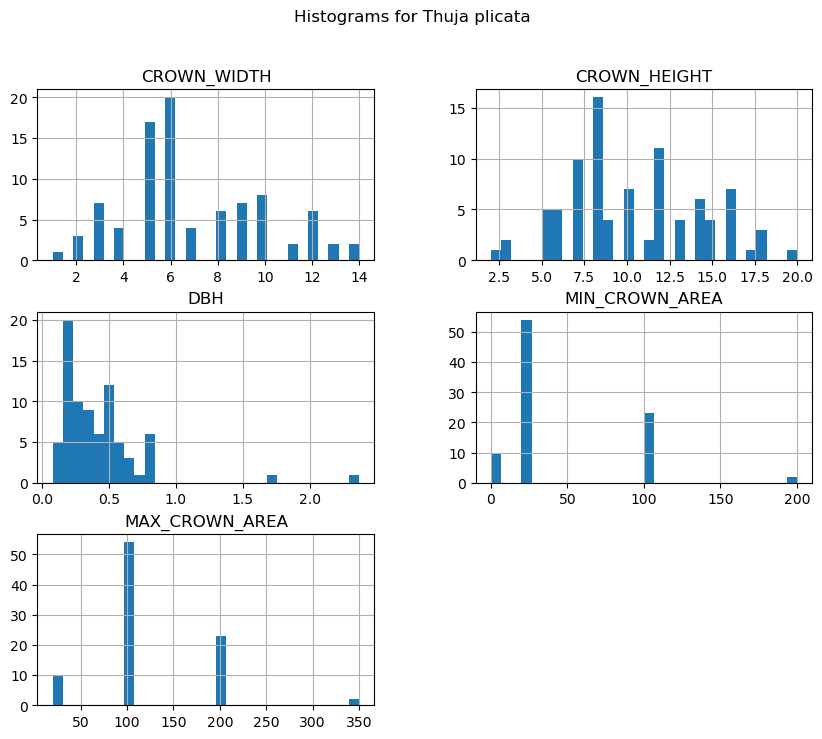

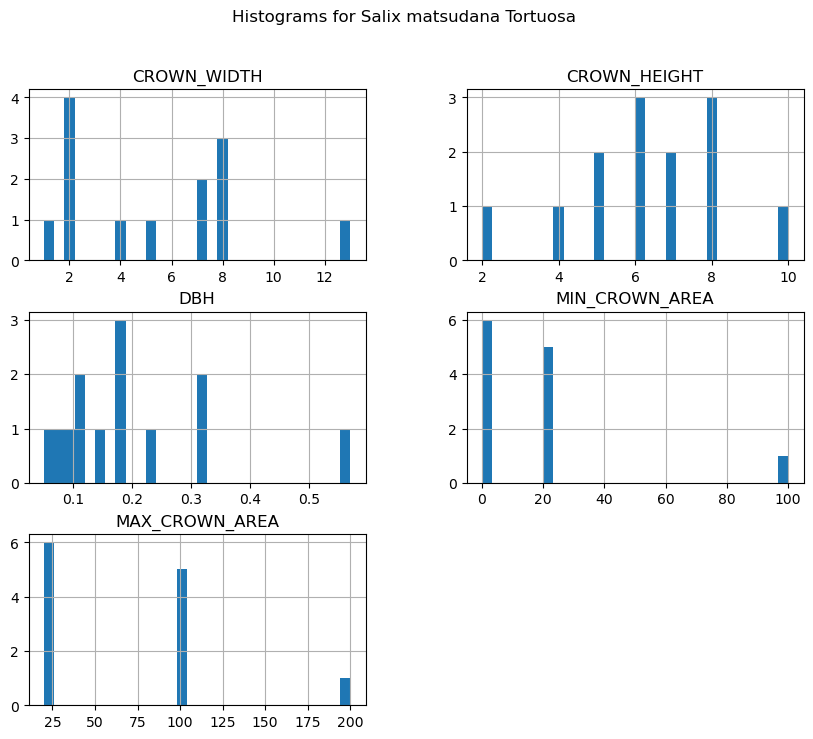

KeyboardInterrupt: 

In [ ]:
import matplotlib.pyplot as plt

numeric_cols = ["CROWN_WIDTH", "CROWN_HEIGHT", "DBH", "MIN_CROWN_AREA", "MAX_CROWN_AREA"]
species_list = df["LATIN_NAME"].dropna().unique()

# for species in species_list:
#     df_species = df[df["LATIN_NAME"] == species]
    
#     for col in numeric_cols:
#         plt.figure()
#         df_species[col].dropna().hist(bins=30)
#         plt.title(f"{col} - {species}")
#         plt.xlabel(col)
#         plt.ylabel("Frequency")
#         plt.show()

for species in species_list:
    df_species = df[df["LATIN_NAME"] == species]
    
    df_species[numeric_cols].hist(bins=30, figsize=(10, 8))
    plt.suptitle(f"Histograms for {species}")
    plt.show()